In [2]:
import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix, hstack
from scipy.io import mmread, mmwrite
import matplotlib.pyplot as plt
from scipy import sparse
import plotly.express as px
import random
import math
import seaborn as sns
from plotly import graph_objects as go
import matplotlib.patches as patches

# North-South UK

In [3]:
df = pd.read_csv("animationDataGB_ConcWins.csv")

In [4]:
df = df.drop(columns=(["LAD1_2", "LAD3_4"]))

### Need to assign each LAD to either North or South

Use the region to say:
East of England, South West, South East, and London constitute 'South'.

In [5]:
LAD_Region_lookup = pd.read_csv("LAD_Region_lookup_UK.csv")

In [6]:
df = df.merge(LAD_Region_lookup, left_on="LAD", right_on="LAD11NM", how="left")

In [7]:
df["NorthIndicator"] = np.where( (df["RGN11NM"] == "South West") | (df["RGN11NM"] == "London") | (df["RGN11NM"] == "South East") | (df["RGN11NM"] == "East of England"), 0, 1) 

In [8]:
df = df.rename(columns={"LAD_x": "LAD"})
df = df.drop(columns=(["LAD_y", "Unnamed: 0_x", "Unnamed: 0_y", "LAD11NM"]))

In [9]:
# how many LADs are in the north
n = df[(df["year"]==2005) & (df["NorthIndicator"]==1)].shape[0]
# how many LADs are in the south
s = df[(df["year"]==2005) & (df["NorthIndicator"]==0)].shape[0]

print([n,s])

[196, 184]


In [10]:
d = 4 # we chose this from the scree plots

years = df["year"].unique()
earlyYears = years[0:3] # 2005-2007
lateYears = years[3:6]  # 2008-2010

In [11]:
mean_diff_early = []
mean_diff_late = []

In [12]:
# make a column that is 1 if the year is an "early year"
df["EarlyIndicator"] = np.where( (df["year"] == earlyYears[0]) | (df["year"] == earlyYears[1]) | (df["year"] == earlyYears[2]), 1, 0) 
earlyNorthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 1) ]
earlySouthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 0) ]
lateNorthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 1) ]
lateSouthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 0) ]

In [13]:
# calculate values of mean_diff_early_i for all i, i.e. all PCs, and store them in order in a vector
# same for mean_diff_late_i

for i in range(0,d):
    valEarly = (1/3*n) * sum( earlyNorthdf.iloc[: ,i])  -  (1/3*s) * sum( earlySouthdf.iloc[: ,i])
    valLate = (1/3*n) * sum( lateNorthdf.iloc[: ,i])  -  (1/3*s) * sum( lateSouthdf.iloc[: ,i])
    mean_diff_early.append(valEarly)
    mean_diff_late.append(valLate)

In [14]:
# calculate T_PC_i
T_PC = np.subtract(mean_diff_early, mean_diff_late)

# length d vector of the subtracted values
T_PC

array([ -34.45263455,  -32.17588903,  -62.28922347, -154.27115477])

In [15]:
T_full_obs = sum(T_PC**2) # this is T_obs
T_obs = T_full_obs # incase I type wrong thing
T_full_obs

29901.808417782388

#### Permute assignments of LADs into before/after independently

If the null hypothesis says that time doesn't matter, the labelling of columns into positions shouldn't matter. So we can permute the assignments.
Each LAD is counted exactly 3 times in the early/late groups, which we might label A and B when permuting to avoid confusion. Which groups the LADs columns are assigned to are done **independently** for each LAD.

In [16]:
ladslist = pd.read_csv("LADS_list_UK.csv", header=None)

ladslist = ladslist[1]
ladslist = list(ladslist)
ladslist = ladslist[1:] # removes a 0 as the first list entry
len(ladslist)

380

#### Put it all together in a loop that iterates P times, and stores P items in a `T_full_p_list` item. 

In [17]:
rand_ones = np.array([0,0,0,1,1,1])
df["A_indicator"] = 0

T_full_p_list = []
P = 5000

# for the individual PCs
T_PC_p_table = pd.DataFrame(columns=['dim1','dim2','dim3','dim4'])

The cell below takes ~5mins to run when $p=5000$.

In [18]:
summariesdf = pd.DataFrame()

for p in range(P):

    for lad in ladslist:
        # to pick 3 timepoints at random for group A
        random.shuffle(rand_ones)
        # populates the "A_indicator" column
        df.loc[df["LAD"] == lad,"A_indicator"] = rand_ones

# split the data into the 4 groups (made up of 2 binary labels, 2*2 = 4)
    A_Northdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 1) ]
    A_Southdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 0) ]
    B_Northdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 1) ]
    B_Southdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 0) ]
    
    ### THIS STUFF IS TO CONSTRUCT CONFIDENCE INTERVALS
    A_North_summaries = [np.mean(A_Northdf['dim1']) , np.mean(A_Northdf['dim2']) , np.mean(A_Northdf['dim3']) , np.mean(A_Northdf['dim4'])]
    A_South_summaries = [np.mean(A_Southdf['dim1']) , np.mean(A_Southdf['dim2']) , np.mean(A_Southdf['dim3']) , np.mean(A_Southdf['dim4'])]
    B_North_summaries = [np.mean(B_Northdf['dim1']) , np.mean(B_Northdf['dim2']) , np.mean(B_Northdf['dim3']) , np.mean(B_Northdf['dim4'])]
    B_South_summaries = [np.mean(B_Southdf['dim1']) , np.mean(B_Southdf['dim2']) , np.mean(B_Southdf['dim3']) , np.mean(B_Southdf['dim4'])]
    summaries = pd.DataFrame (A_North_summaries, columns = ['A_North'])
    summaries['A_South'] = A_South_summaries
    summaries['B_North'] = B_North_summaries
    summaries['B_South'] = B_South_summaries
    summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])
    summaries = summaries.transpose()
    summaries['NorthIndicator'] = [1,0,1,0]
    summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
    summaries['A_Indicator'] = [1,1,0,0]
    summaries['AorB'] = np.where(summaries['A_Indicator'] >0, 'A', 'B')
    summaries['permutation'] = p
    summariesdf = pd.concat([summariesdf, summaries], axis=0)


    # length d vectors of the difference between the mean locations of the North and South for the 2 groups, A and B 
    mean_diff_A_p = []  #A is early, B is late
    mean_diff_B_p = []
    # calculate values of mean_diff_A_i for all i, i.e. all PCs, and store them in order in a vector
    # same for mean_diff_B_i
    for i in range(0,d):
        valA = (1/3*n) * sum( A_Northdf.iloc[: ,i])  -  (1/3*s) * sum( A_Southdf.iloc[: ,i])
        valB = (1/3*n) * sum( B_Northdf.iloc[: ,i])  -  (1/3*s) * sum( B_Southdf.iloc[: ,i])
        mean_diff_A_p.append(valA)
        mean_diff_B_p.append(valB)

    # calculate T_PC_i_p
    T_PC_p = np.subtract(mean_diff_A_p, mean_diff_B_p)

    T_full_p = sum(T_PC_p**2) # this is T_obs

    # values for all dimensions statistic 
    T_full_p_list.append(T_full_p)
    
    # values for individual dimension statistic
    T_PC_p_table.loc[p,:] = T_PC_p

In [19]:
counter = 0
for p in range(P):
    if T_full_p_list[p] > T_obs:
        counter += 1
    else: 
        counter = counter

In [20]:
# how many of the P permutations had a distance larger than T_obs
counter

10

p-value for testing change across all dimensions:

In [21]:
# because we consider:
# p-value = (1/(P+1)) #test statistics >= T_obs 
# where T_obs and T_p are all considered.
(counter+1)/(P+1)

0.0021995600879824036

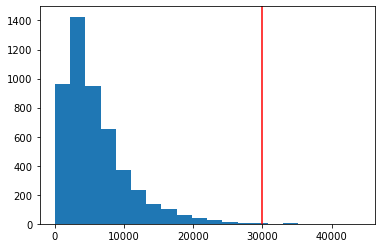

In [22]:
plt.hist(T_full_p_list, bins=20)
plt.axvline(T_obs,color='red')

This is across all d=4 embedding dimensions. We should split this out now to have 4 T_obs, one for each PC, and then get P replicates of T_PC_i

#### Testing if time matters in each of the 4 dimensions independently
I think we can do this as the dimensions are orthogonal

In [23]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table.iloc[p , dim] > T_PC[dim]:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value
PC_p_values

[0.9054189162167566, 0.7418516296740651, 0.946010797840432, 1.0]

In [24]:
# can square all the values in the `T_PC_p_table` table.
# This is to say we are looking at the value of   (mean_diff_A_p_i - mean_diff_B_p_i)**2
# when we look at row p, column i in the table

T_PC_p_table_squared = T_PC_p_table**2 # #square every value in df

Histograms for *mean_diff_A_p_i - mean_diff_B_p_i*, where there is a plot for each `i` (the dimension), and `P` counts. 

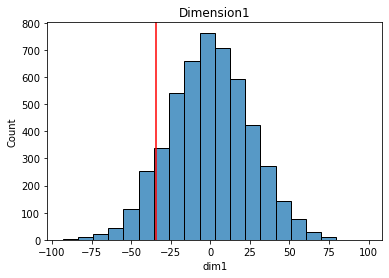

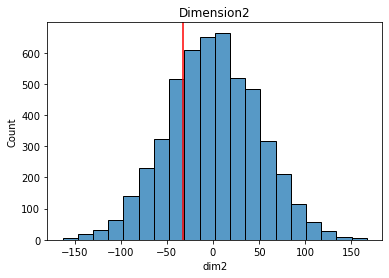

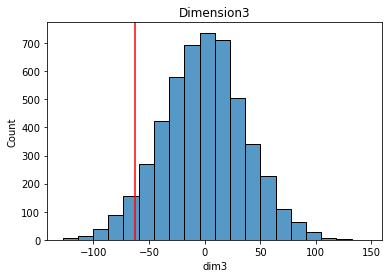

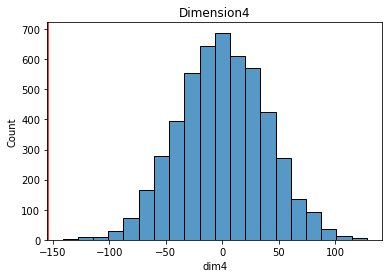

In [25]:
for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table.iloc[:,dim], bins=20)
    plt.axvline(T_PC[dim], color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

### Histograms for *(mean_diff_A_p_i - mean_diff_B_p_i)$^2$*, where there is a plot for each `i` (the dimension), and `P` counts. 

In [26]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table_squared.iloc[p , dim] > (T_PC[dim])**2:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_square_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value

# p-values for each dimension
PC_p_square_values

[0.1809638072385523,
 0.5172965406918616,
 0.09898020395920816,
 0.0001999600079984003]

Tells us at the 5% significance level, we can see that only a significant change for PC4 in that we see a change between the 
**early** years (2005-2007) and the **late** years (2008-2010).

* PC3 is latitude (East-West)
* PC4 is longitude (North-South)

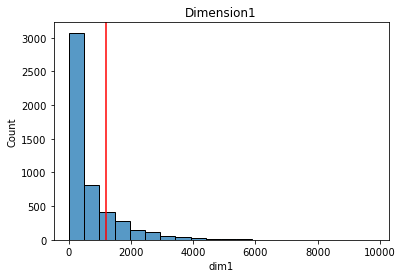

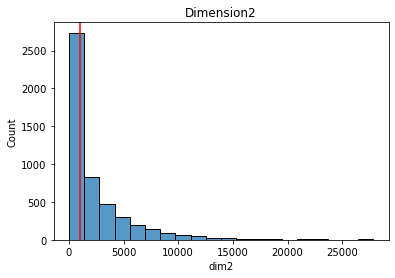

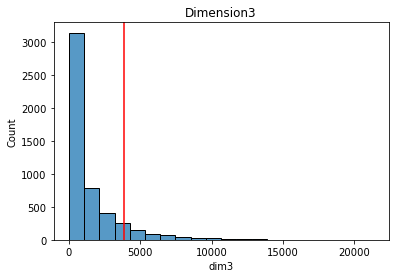

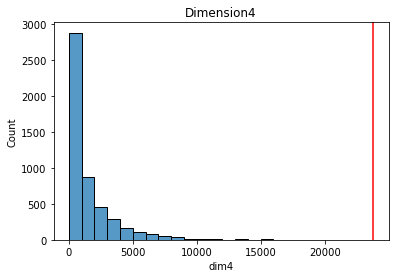

In [27]:
# squared values of distance between mean diff in groups A and B

for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table_squared.iloc[:,dim], bins=20)
    plt.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

In [28]:
# for dim in range(d):
#     f, ax = plt.subplots()
#     ax = sns.kdeplot(T_PC_p_table_squared.iloc[:,dim] , clip=(0.0, 10000))
#     plt.axvline( (T_PC[dim])**2 , color="red")
#     ax.set_title("Dimension{}".format(dim+1))
    
#     fig = ax.get_figure()

#     fig.savefig("pvalueDensityPlots_Dim{}.pdf".format(dim+1))

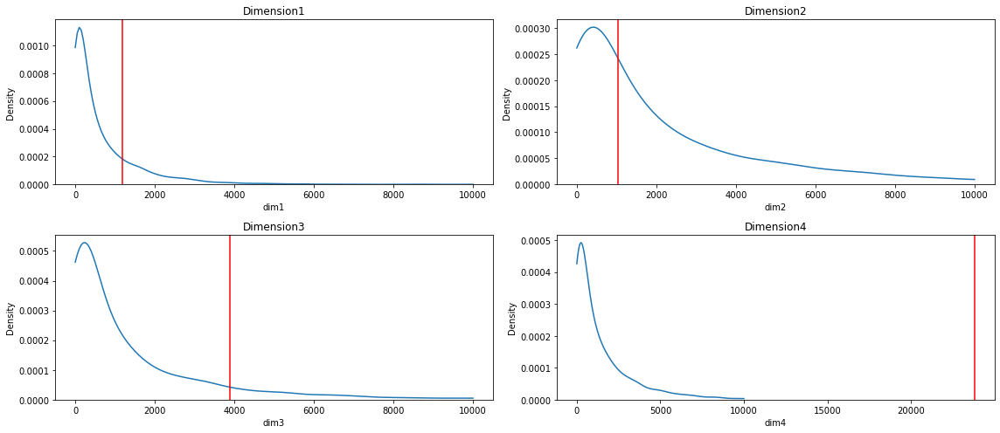

In [29]:
fig, axes = plt.subplots(2,2, figsize=(16,7))

for dim, ax in enumerate(axes.ravel()):
    sns.kdeplot(T_PC_p_table_squared.iloc[:,dim] , clip=(0.0, 10000), ax=ax)
    ax.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
fig.tight_layout()    

fig.savefig("pvalueDensityPlots_GB_ConcWins.pdf")

### Plots and Summary Statistics
06/10/2022

In [30]:
# north is east, south is west
earlyNorth_summaries = [np.mean(earlyNorthdf['dim1']) , np.mean(earlyNorthdf['dim2']) , np.mean(earlyNorthdf['dim3']) , np.mean(earlyNorthdf['dim4'])]
earlySouth_summaries = [np.mean(earlySouthdf['dim1']) , np.mean(earlySouthdf['dim2']) , np.mean(earlySouthdf['dim3']) , np.mean(earlySouthdf['dim4'])]
lateNorth_summaries = [np.mean(lateNorthdf['dim1']) , np.mean(lateNorthdf['dim2']) , np.mean(lateNorthdf['dim3']) , np.mean(lateNorthdf['dim4'])]
lateSouth_summaries = [np.mean(lateSouthdf['dim1']) , np.mean(lateSouthdf['dim2']) , np.mean(lateSouthdf['dim3']) , np.mean(lateSouthdf['dim4'])]

In [31]:
summaries = pd.DataFrame (earlyNorth_summaries, columns = ['earlyNorth'])
summaries['earlySouth'] = earlySouth_summaries
summaries['lateNorth'] = lateNorth_summaries
summaries['lateSouth'] = lateSouth_summaries

summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])

summaries = summaries.transpose()

summaries['NorthIndicator'] = [1,0,1,0]
# changed northorsouth to eastorwest
summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
summaries['EarlyIndicator'] = [1,1,0,0]
summaries['EarlyorLate'] = np.where(summaries['EarlyIndicator'] >0, 'Early', 'Late')

In [32]:
summariesdf

,dim1,dim2,dim3,dim4,NorthIndicator,NorthorSouth,A_Indicator,AorB,permutation
A_North,-0.013663,-0.001238,0.011820,0.004222,1,North,1,A,0
A_South,-0.018562,-0.009303,-0.002133,-0.008952,0,South,1,A,0
B_North,-0.013677,0.000471,0.010755,0.004789,1,North,0,B,0
B_South,-0.018843,-0.009489,-0.002152,-0.010317,0,South,0,B,0
A_North,-0.013427,-0.000754,0.011232,0.004019,1,North,1,A,1
...,...,...,...,...,...,...,...,...,...
B_South,-0.018767,-0.009144,-0.001923,-0.008769,0,South,0,B,4998
A_North,-0.014013,-0.000187,0.011326,0.004916,1,North,1,A,4999
A_South,-0.018945,-0.009195,-0.002451,-0.009374,0,South,1,A,4999
B_North,-0.013327,-0.000580,0.011249,0.004094,1,North,0,B,4999


In [33]:
summariesdf['ABNorthSouth'] = summariesdf['NorthorSouth'] + summariesdf['AorB'] 

In [34]:
fig1 = px.scatter(summariesdf, x="dim3", y="dim4",
                 color ="ABNorthSouth", opacity=0.2,
                 height=500, width=500)

fig2 = px.line(summaries, x='dim3', y='dim4', 
              color='NorthorSouth', markers=True,
              text='EarlyorLate',
                hover_data=['NorthorSouth', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


fig3 = go.Figure(data=fig1.data + fig2.data)
fig3.update_xaxes(range = [max(summariesdf["dim3"])+0.001, min(summariesdf["dim3"])-0.001] )
fig3.update_yaxes(range = [max(summariesdf["dim4"])+0.003, min(summariesdf["dim4"])-0.005 ])
fig3.show()

fig3.write_image("NorthSouth_earlyLate_PC3_4_permPoints_GB_concWins.pdf")

[44450:0502/161248.857846:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command
[44450:0502/161258.018365:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [35]:
fig = px.line(summaries, x='dim3', y='dim4', 
              color='NorthorSouth', markers=True,
              text='EarlyorLate',
                hover_data=['NorthorSouth', 'EarlyorLate'],
             width=500, height=500)

fig.update_traces(textposition='top center')

# fig.add_annotation(x=summaries.loc['earlyNorth','dim3'], y=summaries.loc['earlyNorth','dim4'], text="Early North")
# fig.add_annotation(x=summaries.loc['earlySouth','dim3'], y=summaries.loc['earlySouth','dim4'], text="Early South")
# fig.add_annotation(x=summaries.loc['lateNorth','dim3'], y=summaries.loc['lateNorth','dim4'], text="Late North")
# fig.add_annotation(x=summaries.loc['lateSouth','dim3'], y=summaries.loc['lateSouth','dim4'], text="Late South")

fig.update_layout(yaxis_range=[-0.02,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.show()

In [36]:
fig.write_image("NorthSouth_earlyLate_PC3_4_GB_ConcWins.pdf")

[44450:0502/161258.363053:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [37]:
import plotly.express as px

fig = px.line(summaries, x='dim3', y='dim4', color='NorthorSouth',
              text='EarlyorLate', hover_data=['NorthorSouth', 'EarlyorLate'],
              width=1000, height=400)

fig.update_traces(textposition=['top center', 'bottom center'])

fig.show()

In [38]:
fig.write_image("NS_earlyLate_PC3_4_GB_ConcWins_rectangle.pdf")

[44450:0502/161258.557239:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [45]:
summaries

,dim1,dim2,dim3,dim4,NorthIndicator,NorthorSouth,EarlyIndicator,EarlyorLate
earlyNorth,-0.013795,-0.001631,0.011381,0.005057,1,North,1,Early
earlySouth,-0.018336,-0.010336,-0.001117,-0.006731,0,South,1,Early
lateNorth,-0.013545,0.000864,0.011195,0.003954,1,North,0,Late
lateSouth,-0.019069,-0.008456,-0.003168,-0.012539,0,South,0,Late


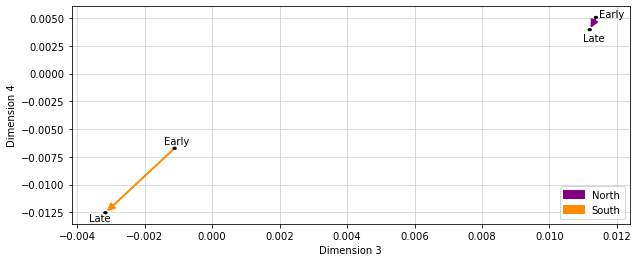

In [53]:
p1 = patches.FancyArrowPatch((summaries['dim3'][0], summaries['dim4'][0]), (summaries['dim3'][2], summaries['dim4'][2]), 
                             arrowstyle='-|>', mutation_scale=15, ec="purple", fc="purple", lw=2, label="North")
p2 = patches.FancyArrowPatch((summaries['dim3'][1], summaries['dim4'][1]), (summaries['dim3'][3], summaries['dim4'][3]), 
                             arrowstyle='-|>', mutation_scale=15, ec="darkorange", fc="darkorange", lw=2, label="South")

p3 = patches.Ellipse((summaries['dim3'][0], summaries['dim4'][0]), height=0.0002, width=0.0001, ec="black", fc="black")
p4 = patches.Ellipse((summaries['dim3'][1], summaries['dim4'][1]), height=0.0002, width=0.0001, ec="black", fc="black")
p5= patches.Ellipse((summaries['dim3'][2], summaries['dim4'][2]), height=0.0002, width=0.0001, ec="black", fc="black")
p6 = patches.Ellipse((summaries['dim3'][3], summaries['dim4'][3]), height=0.0002, width=0.0001, ec="black", fc="black")

fig, ax = plt.subplots(figsize=(10,4))
ax.add_patch(p1)
ax.add_patch(p2)
ax.add_patch(p3)
ax.add_patch(p4)
ax.add_patch(p5)
ax.add_patch(p6)

# adjust the x and y limits of the plot
eps = 0.001
ax.set_xlim(min(summaries['dim3'])-eps, max(summaries['dim3'])+eps)
ax.set_ylim(min(summaries['dim4'])-eps, max(summaries['dim4'])+eps)

plt.annotate(text="Early", xy = (summaries['dim3'][0]+0.1*eps, summaries['dim4'][0]))
plt.annotate(text="Late", xy = (summaries['dim3'][2]-0.2*eps, summaries['dim4'][2]-1*eps))
plt.annotate(text="Late", xy = (summaries['dim3'][3]-0.5*eps, summaries['dim4'][3]-0.8*eps))
plt.annotate(text="Early", xy = (summaries['dim3'][1]-0.3*eps, summaries['dim4'][1]+0.4*eps))

#ax.set_facecolor('xkcd:pale blue')

plt.xlabel("Dimension 3")
plt.ylabel("Dimension 4")

plt.legend(loc=4)
ax.set_axisbelow(True)
ax.grid(color="lightgrey")

plt.savefig("NS_earlyLate_PC3_4_GB_ConcWins_rectangle_arrows.pdf")

plt.show()

#### Other way round lines, i.e. distances that are T_i_obs

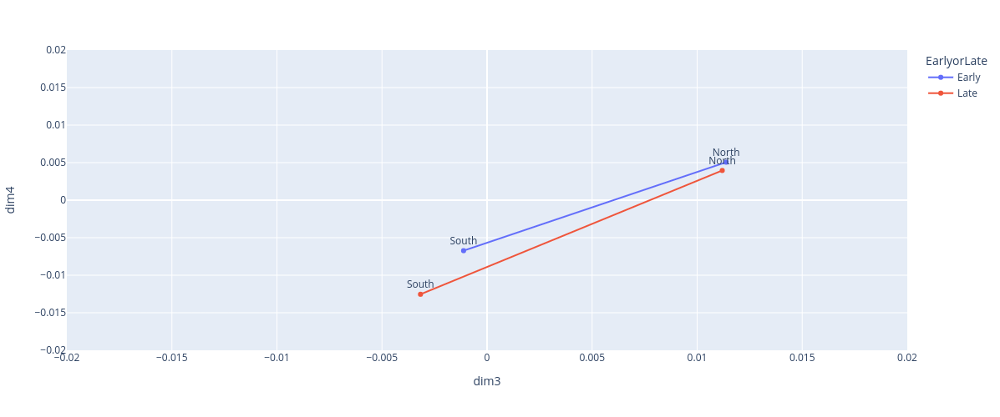

[58719:0106/144859.460890:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [37]:
fig = px.line(summaries, x='dim3', y='dim4', 
              color='EarlyorLate', markers=True,
              text='NorthorSouth',
                hover_data=['NorthorSouth', 'EarlyorLate'],
             width=500, height=500)

fig.update_traces(textposition='top center')

# fig.add_annotation(x=summaries.loc['earlyNorth','dim3'], y=summaries.loc['earlyNorth','dim4'], text="Early North")
# fig.add_annotation(x=summaries.loc['earlySouth','dim3'], y=summaries.loc['earlySouth','dim4'], text="Early South")
# fig.add_annotation(x=summaries.loc['lateNorth','dim3'], y=summaries.loc['lateNorth','dim4'], text="Late North")
# fig.add_annotation(x=summaries.loc['lateSouth','dim3'], y=summaries.loc['lateSouth','dim4'], text="Late South")

fig.update_layout(yaxis_range=[-0.02,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.show()

fig.write_image('earlyLate_NorthSouth_PC3_4_GB_concWins.pdf')

In [33]:
summariesarray = summariesdf.to_numpy()

In [34]:
summaries_earlyLate_array = summaries.to_numpy()

The north and south always occupy different spaces in the dimension 4, but move further apart when we go from early to late. 

In [40]:
(summariesarray[0,2:4], summariesarray[1,2:4])


(array([0.010987412728969461, 0.004299903614003677], dtype=object),
 array([-0.0012343187343760579, -0.010035375167166861], dtype=object))

In [41]:
# Construct confidence intervals for changes in dimensions

Qdf = pd.DataFrame()
TEMP = pd.DataFrame()

A_North_forQdf = summariesdf.loc["A_North"]
A_South_forQdf = summariesdf.loc["A_South"]
B_North_forQdf = summariesdf.loc["B_North"]
B_South_forQdf = summariesdf.loc["B_South"]

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(A_North_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "A_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(A_South_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "A_South"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(B_North_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "B_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(B_South_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "B_South"
Qdf = pd.concat([Qdf,TEMP])
    

In [42]:
# MODIFIED
# Construct confidence intervals for changes in dimensions

summaries_copy = summaries

Qdf = pd.DataFrame()
TEMP = pd.DataFrame()

A_North_forQdf = summariesdf.loc["A_North"]
A_South_forQdf = summariesdf.loc["A_South"]
B_North_forQdf = summariesdf.loc["B_North"]
B_South_forQdf = summariesdf.loc["B_South"]

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(A_North_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "A_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(A_South_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "A_South"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(B_North_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "B_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(B_South_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "B_South"
Qdf = pd.concat([Qdf,TEMP])
    

In [43]:
# MODIFIED
# Construct confidence intervals for changes in dimensions

Qdf_below = pd.DataFrame()
TEMP = pd.DataFrame()

A_North_forQdf = summariesdf.loc["A_North"]
A_South_forQdf = summariesdf.loc["A_South"]
B_North_forQdf = summariesdf.loc["B_North"]
B_South_forQdf = summariesdf.loc["B_South"]

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(A_North_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "A_North"
Qdf_below = pd.concat([Qdf_below,TEMP])

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(A_South_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "A_South"
Qdf_below = pd.concat([Qdf_below,TEMP])

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(B_North_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "B_North"
Qdf_below = pd.concat([Qdf_below,TEMP])

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(B_South_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "B_South"
Qdf_below = pd.concat([Qdf_below,TEMP])

In [44]:
Qdf_below = Qdf_below.reset_index()
Qdf = Qdf.reset_index()

In [45]:
# Qdf

In [46]:
summaries_copy = summaries_copy.reset_index()

In [47]:
# summaries_copy

In [48]:
comb_df = pd.concat([summaries_copy, Qdf],axis=1)
comb_df = pd.concat([comb_df, Qdf_below],axis=1)

In [49]:
# comb_df

In [50]:
comb_df.to_csv('CIplottingdf_GB_concWins.csv')

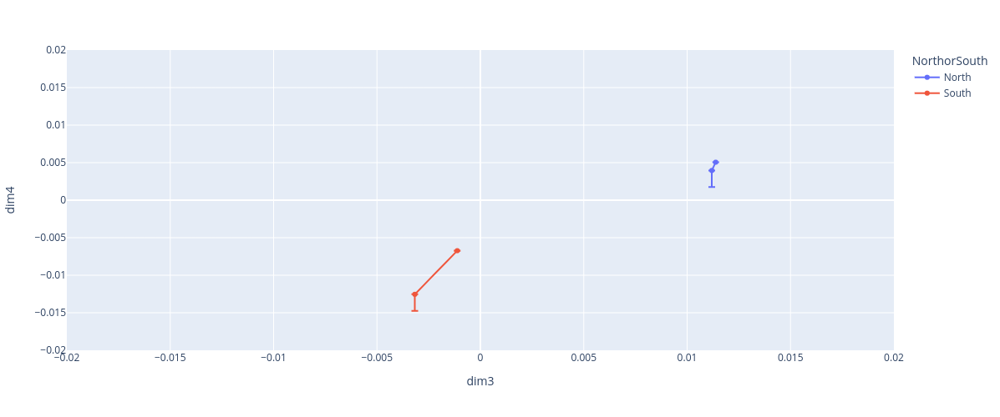

In [51]:
fig = px.line(summaries, x='dim3', y='dim4', 
              color='NorthorSouth', markers=True,
                hover_data=['NorthorSouth', 'EarlyorLate'],
             width=500, height=500)
fig.update_layout(yaxis_range=[-0.02,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.update_traces(error_y={
    "type": "data",
    "symmetric": False,
    "array": comb_df['dim4_95'] - comb_df['dim4'],
    "arrayminus": summaries['dim4'] - Qdf_below['dim4_5']
})
fig.show()

Plot the $P$ resamples of the mean positions of A_North, A_South, B_North, B_South (so $4P$ points) where we are under the null hypothesis to see where these mean positions are when we *don't* care about time. Then we plot the 4 points where we *do* care about time.

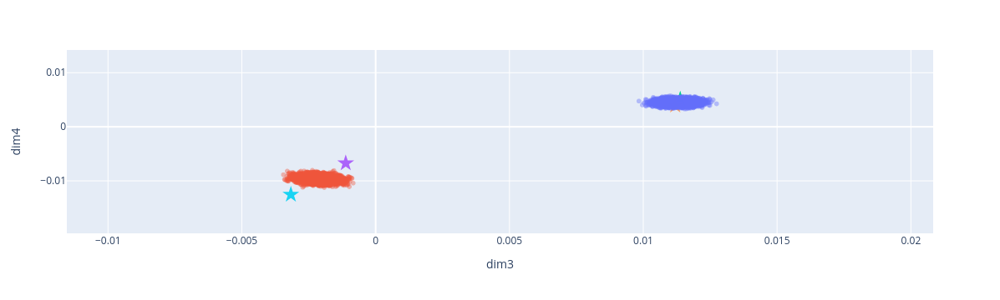

In [52]:
fig = px.scatter(summariesdf, x="dim3", y="dim4",
                color="NorthorSouth",opacity=0.4,
                hover_data=["NorthorSouth","permutation", "AorB"])
fig.update_layout(showlegend=False)
fig.update_xaxes(range = [min(summariesdf["dim3"]), max(summariesdf["dim3"])] )
fig.update_yaxes(range = [min(summariesdf["dim4"]), max(summariesdf["dim4"])] )
fig.update_traces(textposition="top center")

fig.add_trace(go.Scatter(x =[ (summaries.loc['earlyNorth', 'dim3'])], y = [(summaries.loc['earlyNorth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
   hovertext=["earlyNorth"],
   marker_size = 15))

fig.add_trace(go.Scatter(x =[ (summaries.loc['earlySouth', 'dim3'])], y = [(summaries.loc['earlySouth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
    hovertext=["earlySouth"],
    marker_size = 15))
fig.add_trace(go.Scatter(x =[ (summaries.loc['lateNorth', 'dim3'])], y = [(summaries.loc['lateNorth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
    hovertext=['lateNorth'],
   marker_size = 15))
fig.add_trace(go.Scatter(x =[ (summaries.loc['lateSouth', 'dim3'])], y = [(summaries.loc['lateSouth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
    hovertext=['lateSouth'],
   marker_size = 15))

fig.show()

# 07/10/2022 Stuff - Hope this is right! see paper notebook too

In [53]:
lowerQs = []
for i in range(4):
    TEMP = T_PC_p_table_squared.iloc[:,i].quantile(q=[0.05])
    lowerQs.append(TEMP)
    
upperQs = []
for i in range(4):
    TEMP = T_PC_p_table_squared.iloc[:,i].quantile(q=[0.95])
    upperQs.append(TEMP)

In [54]:
lowerQdf = pd.DataFrame(lowerQs)
upperQdf = pd.DataFrame(upperQs)

In [55]:
Qdf = pd.concat([lowerQdf, upperQdf],axis=1)

In [56]:
T_PC_squared = pd.DataFrame(T_PC**2, index=['dim1','dim2','dim3','dim4'])
T_PC_squared.columns=(['TimeMatters'])

In [57]:
Qdf = pd.concat([Qdf, T_PC_squared], axis=1)

In [58]:
Qdf

,0.05,0.95,TimeMatters
dim1,2.280244,2500.345046,1186.984027
dim2,7.412803,9331.603690,1035.287835
dim3,6.561969,5505.654752,3879.947361
dim4,7.516847,5891.871662,23799.589195


In [59]:
Qdf.to_csv('CIplottingdf_take2_UK.csv')

In [60]:
df.head(2)

,dim1,dim2,dim3,dim4,year,Xscaled,Yscaled,LAD,col,index,LAD11CD,RGN11CD,RGN11NM,NorthIndicator,EarlyIndicator,A_indicator
0,-0.097349,0.132097,-0.091336,0.003295,2005,0.801441,0.145821,Westminster,#CC3325,179,E09000033,E12000007,London,0,1,0
1,-0.069690,0.058203,-0.024107,0.028544,2005,0.811587,0.142026,Southwark,#CF3324,321,E09000028,E12000007,London,0,1,1


## Average per year movements of the North and South -- 17/10/2022

In [35]:
yearOnYear = []

for year in range(2005,2011):
    data = df[df['year'] == year]
    dataN = data[data['NorthIndicator']==0]
    dataS = data[data['NorthIndicator']==1]
    avgN = [np.mean(dataN['dim1']), np.mean(dataN['dim2']), np.mean(dataN['dim3']), np.mean(dataN['dim4']), "North" , year]
    avgS = [np.mean(dataS['dim1']), np.mean(dataS['dim2']), np.mean(dataS['dim3']), np.mean(dataS['dim4']), "South" , year]
    
    yearOnYear.append(avgN)
    yearOnYear.append(avgS)


In [36]:
yearOnYear = pd.DataFrame(yearOnYear, columns=['dim1', 'dim2', 'dim3', 'dim4', 'NorS', 'year'])

In [37]:
yearOnYear

,dim1,dim2,dim3,dim4,NorS,year
0,-0.023391,-0.005839,-0.003827,-0.005069,North,2005
1,-0.018221,0.002865,0.010287,0.006470,South,2005
2,-0.014828,-0.012899,0.000327,-0.006059,North,2006
3,-0.011409,-0.002796,0.011190,0.004207,South,2006
4,-0.016787,-0.012270,0.000148,-0.009064,North,2007
5,-0.011755,-0.004962,0.012665,0.004492,South,2007
6,-0.026869,-0.009005,-0.003927,-0.014303,North,2008
7,-0.019069,0.000436,0.015725,0.004988,South,2008
8,-0.010061,-0.008541,-0.000787,-0.007238,North,2009
9,-0.006769,0.001015,0.006304,0.003638,South,2009


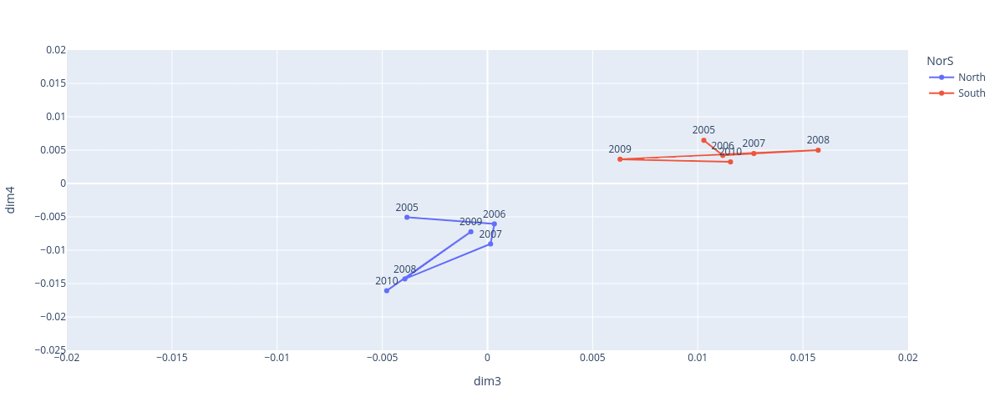

[58719:0106/144900.509353:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [64]:
fig = px.line(yearOnYear, x='dim3', y='dim4', 
              color='NorS', markers=True,
              text='year',
                hover_data=['NorS', 'year'],
             width=500, height=500)

fig.update_traces(textposition='top center')


fig.update_layout(yaxis_range=[-0.025,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.show()

fig.write_image('yearOnYear_Dim1_2_GB_concWins.pdf')

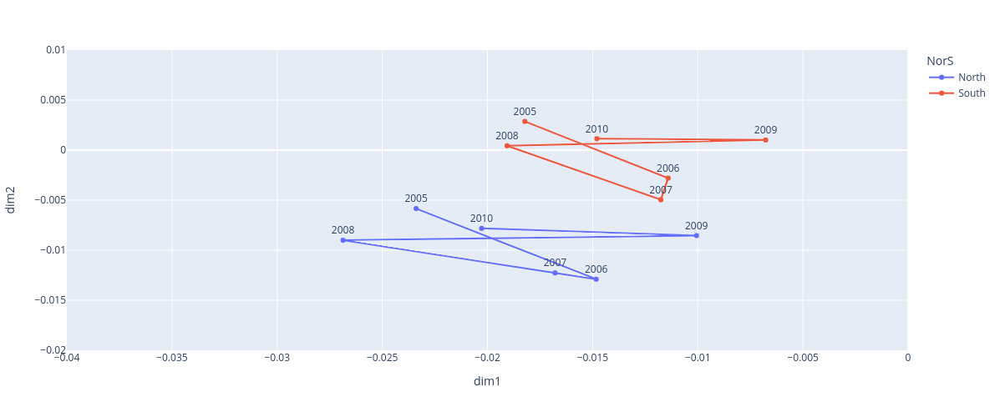

[58719:0106/144900.728170:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [65]:
fig = px.line(yearOnYear, x='dim1', y='dim2', 
              color='NorS', markers=True,
              text='year',
                hover_data=['NorS', 'year'],
             width=500, height=500)

fig.update_traces(textposition='top center')


fig.update_layout(yaxis_range=[-0.02,0.01])
fig.update_layout(xaxis_range=[-0.04,0])
fig.show()

fig.write_image('yearOnYear_Dim3_4_GB_concWins.pdf')

Plot for each year to see what North and South are doing over time. Trying to justify splitting into early/late and testing. 

/tmp/ipykernel_218410/1081648401.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_218410/1081648401.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_218410/1081648401.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_218410/1081648401.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



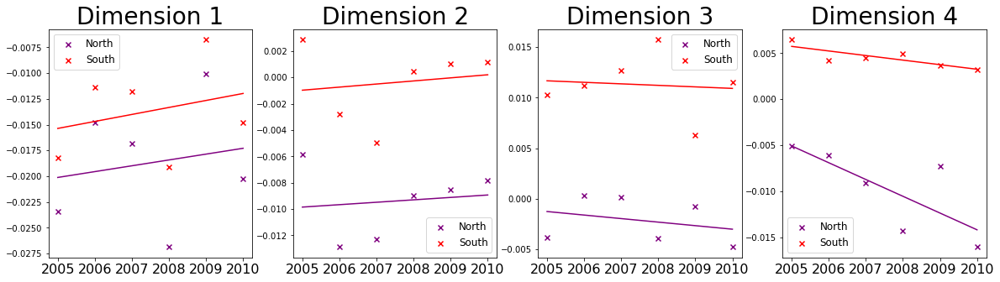

In [44]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension {1+i}', fontsize=28)
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)), fontsize=16)
    N = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    years = range(2005,2011)
    ax.scatter(years, N, color="purple", label='North', marker='x') #plot North points
    a, b = np.polyfit(years, N, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="purple") # add LoB to plot
    ax.scatter(years, S, color="red", label='South', marker='x')
    a, b = np.polyfit(years, S, 1)
    ax.plot(years, a*years+b, color="red") 
    ax.legend(loc="best", fontsize=12)
    
plt.savefig('AverageValueYearOnYear_NS_perDimension_GB_concWins.pdf')

/tmp/ipykernel_58194/726969024.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_58194/726969024.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_58194/726969024.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_58194/726969024.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



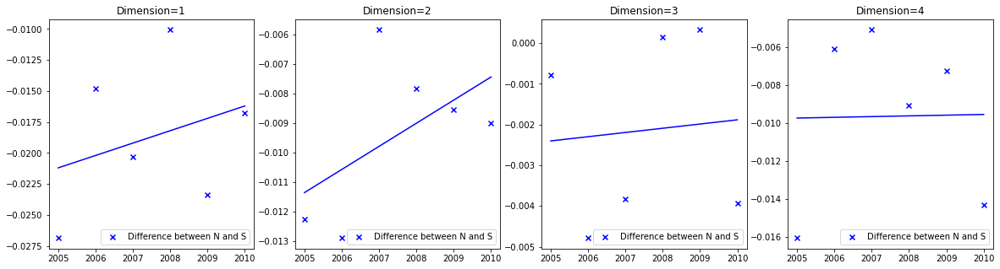

In [67]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension={1+i}')
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)))
    N = set(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = set(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    diff = list(N-S)
    years = range(2005,2011)
    ax.scatter(years, diff, color="blue", label='Difference between N and S', marker='x') #plot diff
    a, b = np.polyfit(years, diff, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="blue") # add LoB to plot 
    ax.legend(loc="best")
    
plt.savefig('AverageValueYearOnYear_diff_perDimension_GB_concWins.pdf')

# London or not London (UK)

In [54]:
df = pd.read_csv("animationDataGB_ConcWins.csv")

In [55]:
df = df.drop(columns=(["LAD1_2", "LAD3_4"]))

### Need to assign each LAD to either North or South

Use the region to say:
East of England, South West, South East, and London constitute 'South'.

In [56]:
LAD_Region_lookup = pd.read_csv("LAD_Region_lookup_UK.csv")

In [57]:
df = df.merge(LAD_Region_lookup, left_on="LAD", right_on="LAD11NM", how="left")

#### Change this so that what is "North" in the code now represents "London"

In [58]:
df["NorthIndicator"] = np.where( (df["RGN11NM"] == "London") , 1 ,0) 

In [59]:
df = df.rename(columns={"LAD_x": "LAD"})
df = df.drop(columns=(["LAD_y", "Unnamed: 0_x","Unnamed: 0_y", "LAD11NM"]))

In [60]:
# how many LADs are in the north
n = df[(df["year"]==2005) & (df["NorthIndicator"]==1)].shape[0]
# how many LADs are in the south
s = df[(df["year"]==2005) & (df["NorthIndicator"]==0)].shape[0]

print([n,s])

[33, 347]


In [61]:
d = 4 # we chose this from the scree plots

years = df["year"].unique()
earlyYears = years[0:3] # 2005-2007
lateYears = years[3:6]  # 2008-2010

In [62]:
mean_diff_early = []
mean_diff_late = []

In [63]:
# make a column that is 1 if the year is an "early year"
df["EarlyIndicator"] = np.where( (df["year"] == earlyYears[0]) | (df["year"] == earlyYears[1]) | (df["year"] == earlyYears[2]), 1, 0) 
earlyNorthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 1) ]
earlySouthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 0) ]
lateNorthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 1) ]
lateSouthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 0) ]

In [64]:
# calculate values of mean_diff_early_i for all i, i.e. all PCs, and store them in order in a vector
# same for mean_diff_late_i

for i in range(0,d):
    valEarly = (1/3*n) * sum( earlyNorthdf.iloc[: ,i])  -  (1/3*s) * sum( earlySouthdf.iloc[: ,i])
    valLate = (1/3*n) * sum( lateNorthdf.iloc[: ,i])  -  (1/3*s) * sum( lateSouthdf.iloc[: ,i])
    mean_diff_early.append(valEarly)
    mean_diff_late.append(valLate)

In [65]:
# calculate T_PC_i
T_PC = np.subtract(mean_diff_early, mean_diff_late)

# length d vector of the subtracted values
T_PC

array([ -43.09706837,  280.16180226,  -68.9277021 , -406.08562732])

In [66]:
T_full_obs = sum(T_PC**2) # this is T_obs
T_obs = T_full_obs # incase I type wrong thing
T_full_obs

250004.55757785123

#### Permute assignments of LADs into before/after independently

If the null hypothesis says that time doesn't matter, the labelling of columns into positions shouldn't matter. So we can permute the assignments.
Each LAD is counted exactly 3 times in the early/late groups, which we might label A and B when permuting to avoid confusion. Which groups the LADs columns are assigned to are done **independently** for each LAD.

In [67]:
ladslist = pd.read_csv("LADS_list_UK.csv", header=None)

ladslist = ladslist[1]
ladslist = list(ladslist)
ladslist = ladslist[1:] # removes a 0 as the first list entry
len(ladslist)

380

#### Put it all together in a loop that iterates P times, and stores P items in a `T_full_p_list` item. 

In [68]:
rand_ones = np.array([0,0,0,1,1,1])
df["A_indicator"] = 0

T_full_p_list = []
P = 5000

# for the individual PCs
T_PC_p_table = pd.DataFrame(columns=['dim1','dim2','dim3','dim4'])

The cell below takes ~5mins to run when $p=5000$.

In [69]:
summariesdf = pd.DataFrame()


for p in range(P):

    for lad in ladslist:
        # to pick 3 timepoints at random for group A
        random.shuffle(rand_ones)
        # populates the "A_indicator" column
        df.loc[df["LAD"] == lad,"A_indicator"] = rand_ones

# split the data into the 4 groups (made up of 2 binary labels, 2*2 = 4)
    A_Northdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 1) ]
    A_Southdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 0) ]
    B_Northdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 1) ]
    B_Southdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 0) ]
    
    ### THIS STUFF IS TO CONSTRUCT CONFIDENCE INTERVALS
    A_North_summaries = [np.mean(A_Northdf['dim1']) , np.mean(A_Northdf['dim2']) , np.mean(A_Northdf['dim3']) , np.mean(A_Northdf['dim4'])]
    A_South_summaries = [np.mean(A_Southdf['dim1']) , np.mean(A_Southdf['dim2']) , np.mean(A_Southdf['dim3']) , np.mean(A_Southdf['dim4'])]
    B_North_summaries = [np.mean(B_Northdf['dim1']) , np.mean(B_Northdf['dim2']) , np.mean(B_Northdf['dim3']) , np.mean(B_Northdf['dim4'])]
    B_South_summaries = [np.mean(B_Southdf['dim1']) , np.mean(B_Southdf['dim2']) , np.mean(B_Southdf['dim3']) , np.mean(B_Southdf['dim4'])]
    summaries = pd.DataFrame (A_North_summaries, columns = ['A_North'])
    summaries['A_South'] = A_South_summaries
    summaries['B_North'] = B_North_summaries
    summaries['B_South'] = B_South_summaries
    summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])
    summaries = summaries.transpose()
    summaries['NorthIndicator'] = [1,0,1,0]
    summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
    summaries['A_Indicator'] = [1,1,0,0]
    summaries['AorB'] = np.where(summaries['A_Indicator'] >0, 'A', 'B')
    summaries['permutation'] = p
    summariesdf = pd.concat([summariesdf, summaries], axis=0)


    # length d vectors of the difference between the mean locations of the North and South for the 2 groups, A and B 
    mean_diff_A_p = []  #A is early, B is late
    mean_diff_B_p = []
    # calculate values of mean_diff_A_i for all i, i.e. all PCs, and store them in order in a vector
    # same for mean_diff_B_i
    for i in range(0,d):
        valA = (1/3*n) * sum( A_Northdf.iloc[: ,i])  -  (1/3*s) * sum( A_Southdf.iloc[: ,i])
        valB = (1/3*n) * sum( B_Northdf.iloc[: ,i])  -  (1/3*s) * sum( B_Southdf.iloc[: ,i])
        mean_diff_A_p.append(valA)
        mean_diff_B_p.append(valB)

    # calculate T_PC_i_p
    T_PC_p = np.subtract(mean_diff_A_p, mean_diff_B_p)

    T_full_p = sum(T_PC_p**2) # this is T_obs

    # values for all dimensions statistic 
    T_full_p_list.append(T_full_p)
    
    # values for individual dimension statistic
    T_PC_p_table.loc[p,:] = T_PC_p

In [70]:
counter = 0
for p in range(P):
    if T_full_p_list[p] > T_obs:
        counter += 1
    else: 
        counter = counter

In [71]:
# how many of the P permutations had a distance larger than T_obs
counter

0

p-value for testing change across all dimensions:

In [72]:
# because we consider:
# p-value = (1/(P+1)) #test statistics >= T_obs 
# where T_obs and T_p are all considered.
(counter+1)/(P+1)

0.000999000999000999

In [73]:
# plt.hist(T_full_p_list, bins=20)
# plt.axvline(T_obs,color='red')

This is across all d=4 embedding dimensions. We should split this out now to have 4 T_obs, one for each PC, and then get P replicates of T_PC_i

#### Testing if time matters in each of the 4 dimensions independently
I think we can do this as the dimensions are orthogonal

In [74]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table.iloc[p , dim] > T_PC[dim]:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value
PC_p_values

[0.8361638361638362, 0.000999000999000999, 0.8721278721278721, 1.0]

In [75]:
# can square all the values in the `T_PC_p_table` table.
# This is to say we are looking at the value of   (mean_diff_A_p_i - mean_diff_B_p_i)**2
# when we look at row p, column i in the table

T_PC_p_table_squared = T_PC_p_table**2 # #square every value in df

Histograms for *mean_diff_A_p_i - mean_diff_B_p_i*, where there is a plot for each `i` (the dimension), and `P` counts. 

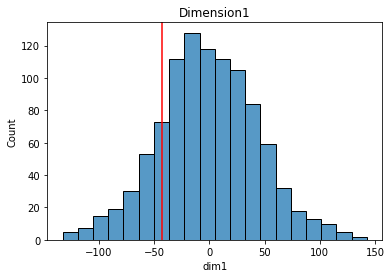

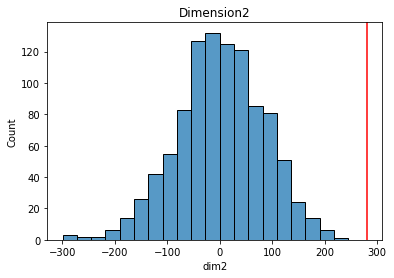

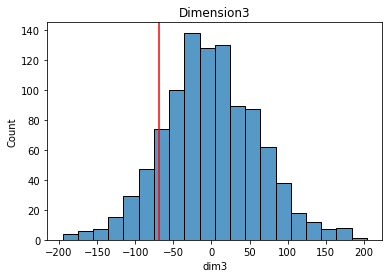

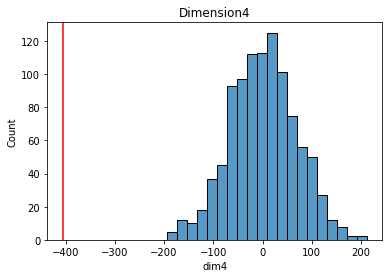

In [76]:
for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table.iloc[:,dim], bins=20)
    plt.axvline(T_PC[dim], color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

### Histograms for *(mean_diff_A_p_i - mean_diff_B_p_i)$^2$*, where there is a plot for each `i` (the dimension), and `P` counts. 

In [77]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table_squared.iloc[p , dim] > (T_PC[dim])**2:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_square_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value

# p-values for each dimension
PC_p_square_values

[0.32167832167832167,
 0.002997002997002997,
 0.25874125874125875,
 0.000999000999000999]

Tells us at the 5% significance level, we can see there are significant changes for PC2 and PC3 in that we see a change between the 
**early** years (2005-2007) and the **late** years (2008-2010). This is for *London-notLondon*

For N/S divide stuff we saw significance in PC4.

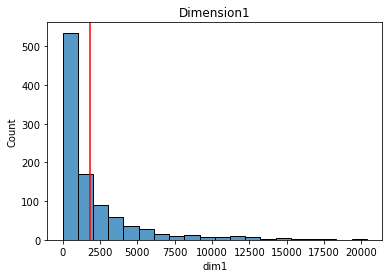

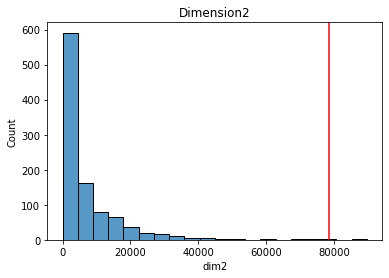

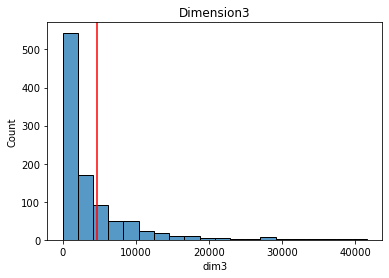

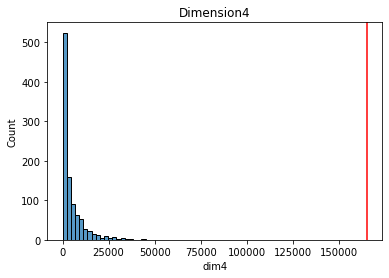

In [78]:
# squared values of distance between mean diff in groups A and B

for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table_squared.iloc[:,dim], bins=20)
    plt.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

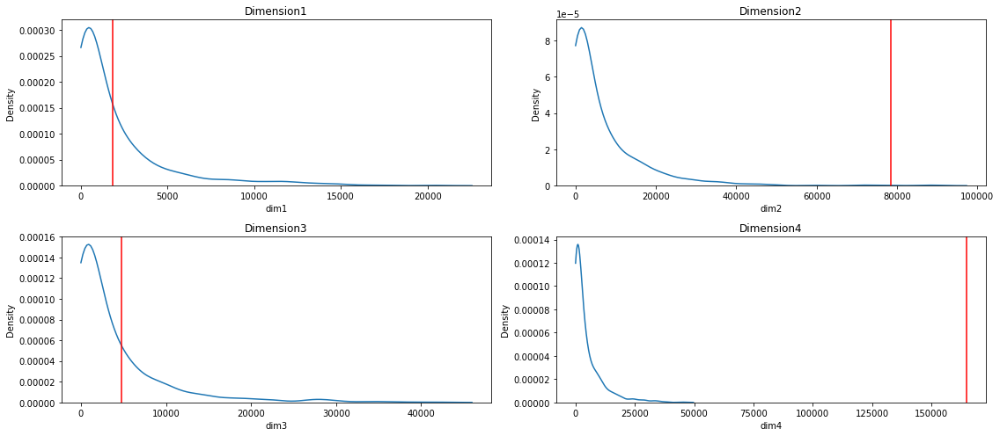

In [79]:
fig, axes = plt.subplots(2,2, figsize=(16,7))

for dim, ax in enumerate(axes.ravel()):
    sns.kdeplot(T_PC_p_table_squared.iloc[:,dim] , clip=(0.0, 2500000), ax=ax)
    ax.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
fig.tight_layout()    


### Plots and Summary Statistics
06/10/2022

In [80]:
earlyNorth_summaries = [np.mean(earlyNorthdf['dim1']) , np.mean(earlyNorthdf['dim2']) , np.mean(earlyNorthdf['dim3']) , np.mean(earlyNorthdf['dim4'])]
earlySouth_summaries = [np.mean(earlySouthdf['dim1']) , np.mean(earlySouthdf['dim2']) , np.mean(earlySouthdf['dim3']) , np.mean(earlySouthdf['dim4'])]
lateNorth_summaries = [np.mean(lateNorthdf['dim1']) , np.mean(lateNorthdf['dim2']) , np.mean(lateNorthdf['dim3']) , np.mean(lateNorthdf['dim4'])]
lateSouth_summaries = [np.mean(lateSouthdf['dim1']) , np.mean(lateSouthdf['dim2']) , np.mean(lateSouthdf['dim3']) , np.mean(lateSouthdf['dim4'])]

In [81]:
summaries = pd.DataFrame (earlyNorth_summaries, columns = ['earlyNorth'])
summaries['earlySouth'] = earlySouth_summaries
summaries['lateNorth'] = lateNorth_summaries
summaries['lateSouth'] = lateSouth_summaries

summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])

summaries = summaries.transpose()

summaries['NorthIndicator'] = [1,0,1,0]
summaries['LondonorNot'] = np.where(summaries['NorthIndicator'] >0, 'London', 'notLondon')
summaries['EarlyIndicator'] = [1,1,0,0]
summaries['EarlyorLate'] = np.where(summaries['EarlyIndicator'] >0, 'Early', 'Late')

In [82]:
summariesdf['ABNorthSouth'] = summariesdf['NorthorSouth'] + summariesdf['AorB'] 

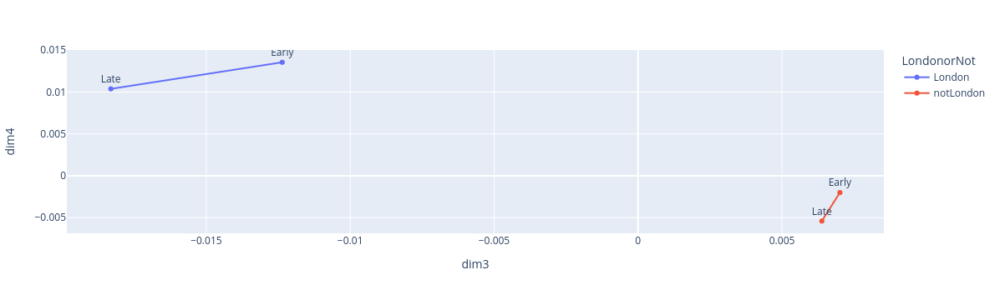

In [83]:
# fig1 = px.scatter(summariesdf, x="dim3", y="dim4",
#                  color ="ABNorthSouth", opacity=0.2,
#                  height=500, width=500)

fig2 = px.line(summaries, x='dim3', y='dim4', 
              color='LondonorNot', markers=True,
              text='EarlyorLate',
                hover_data=['LondonorNot', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


# fig3 = go.Figure(data=fig2.data + fig1.data)
# fig3.update_xaxes(range = [max(summariesdf["dim3"])+0.005, min(summariesdf["dim3"])-0.005] )
# fig3.update_yaxes(range = [max(summariesdf["dim4"])+0.003, min(summariesdf["dim4"])-0.005 ])
# fig3.show()

fig2.show()

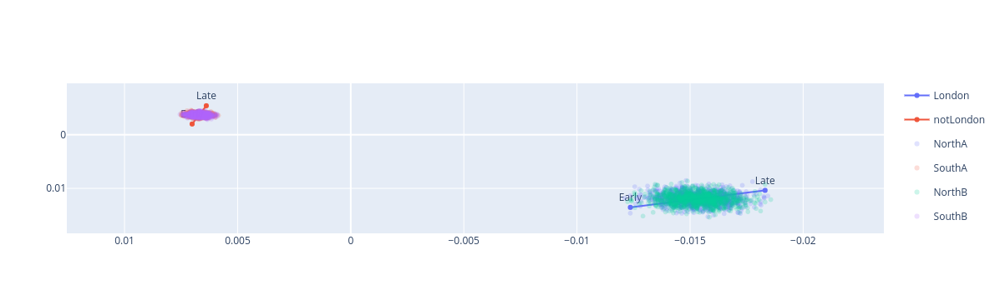

In [84]:
fig1 = px.scatter(summariesdf, x="dim3", y="dim4",
                 color ="ABNorthSouth", opacity=0.2,
                 height=500, width=500)

fig2 = px.line(summaries, x='dim3', y='dim4', 
              color='LondonorNot', markers=True,
              text='EarlyorLate',
                hover_data=['LondonorNot', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


fig3 = go.Figure(data=fig2.data + fig1.data)
fig3.update_xaxes(range = [max(summariesdf["dim3"])+0.005, min(summariesdf["dim3"])-0.005] )
fig3.update_yaxes(range = [max(summariesdf["dim4"])+0.003, min(summariesdf["dim4"])-0.005 ])
fig3.show()

#fig2.show()

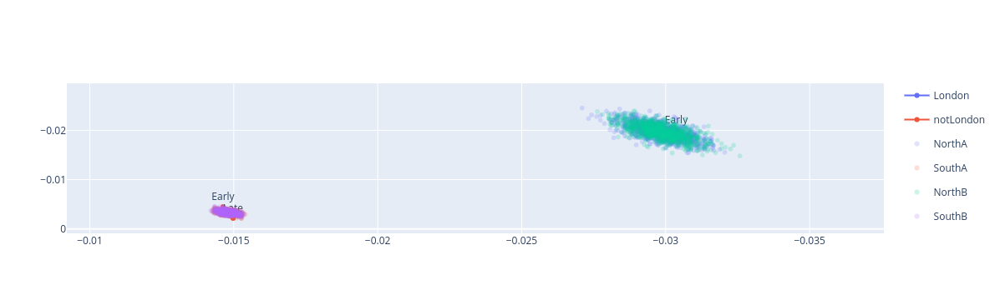

In [85]:
fig1 = px.scatter(summariesdf, x="dim1", y="dim2",
                 color ="ABNorthSouth", opacity=0.2,
                 height=500, width=500)

fig2 = px.line(summaries, x='dim1', y='dim2', 
              color='LondonorNot', markers=True,
              text='EarlyorLate',
                hover_data=['LondonorNot', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


fig3 = go.Figure(data=fig2.data + fig1.data)
fig3.update_xaxes(range = [max(summariesdf["dim1"])+0.005, min(summariesdf["dim1"])-0.005] )
fig3.update_yaxes(range = [max(summariesdf["dim2"])+0.003, min(summariesdf["dim2"])-0.005 ])
fig3.show()


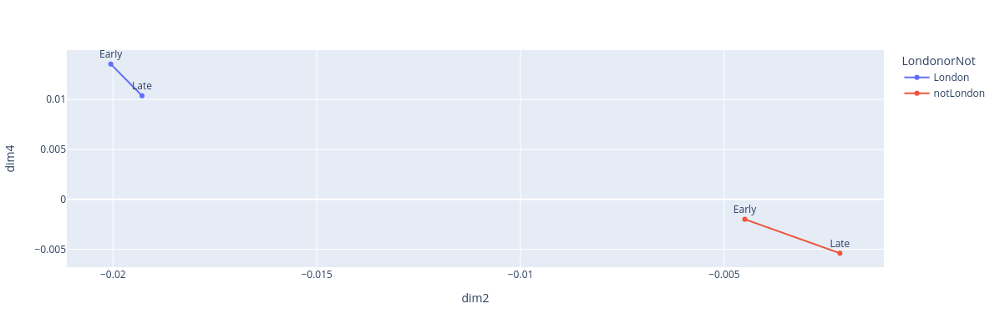

In [86]:
# same fig as before but with different size boundaries

fig = px.line(summaries, x='dim2', y='dim4', 
              color='LondonorNot', markers=True,
              text='EarlyorLate',
                hover_data=['LondonorNot'],
             width=1000, height=400)

fig.update_traces(textposition='top center')

# fig.add_annotation(x=summaries.loc['earlyNorth','dim3'], y=summaries.loc['earlyNorth','dim4'], text="Early North")
# fig.add_annotation(x=summaries.loc['earlySouth','dim3'], y=summaries.loc['earlySouth','dim4'], text="Early South")
# fig.add_annotation(x=summaries.loc['lateNorth','dim3'], y=summaries.loc['lateNorth','dim4'], text="Late North")
# fig.add_annotation(x=summaries.loc['lateSouth','dim3'], y=summaries.loc['lateSouth','dim4'], text="Late South")

fig.show()

In [90]:
summaries

,dim1,dim2,dim3,dim4,NorthIndicator,LondonorNot,EarlyIndicator,EarlyorLate
earlyNorth,-0.030368,-0.020055,-0.012360,0.013547,1,London,1,Early
earlySouth,-0.014627,-0.004495,0.007011,-0.002001,0,notLondon,1,Early
lateNorth,-0.029311,-0.019289,-0.018315,0.010374,1,London,0,Late
lateSouth,-0.014975,-0.002161,0.006385,-0.005402,0,notLondon,0,Late


In [93]:
summaries['dim4'][0] - summaries['dim4'][1]

0.015547645204365673

In [94]:
summaries['dim4'][2] - summaries['dim4'][3]

0.01577628549274948

In [42]:
fig.write_image('LondonorNot_dim2_4_earlylate.png')

[29105:0207/162106.543384:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


I think it's fair to say it's a diverging trend. Plot dims 2 and 4 as they have significant p-values for change. 

## Average per year movements of the London and not London 
-- 05/12/2022

In [ ]:
yearOnYear = []

for year in range(2005,2011):
    data = df[df['year'] == year]
    dataN = data[data['NorthIndicator']==0]
    dataS = data[data['NorthIndicator']==1]
    avgN = [np.mean(dataN['dim1']), np.mean(dataN['dim2']), np.mean(dataN['dim3']), np.mean(dataN['dim4']), "North" , year]
    avgS = [np.mean(dataS['dim1']), np.mean(dataS['dim2']), np.mean(dataS['dim3']), np.mean(dataS['dim4']), "South" , year]
    
    yearOnYear.append(avgN)
    yearOnYear.append(avgS)

In [ ]:
yearOnYear = pd.DataFrame(yearOnYear, columns=['dim1', 'dim2', 'dim3', 'dim4', 'NorS', 'year'])

Plot for each year to see what North and South are doing over time. Trying to justify splitting into early/late and testing. 

In [ ]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension={1+i}')
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)))
    N = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    years = range(2005,2011)
    ax.scatter(years, N, color="purple", label='London', marker='x') #plot London points
    a, b = np.polyfit(years, N, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="purple") # add LoB to plot
    ax.scatter(years, S, color="red", label='not London', marker='x')
    a, b = np.polyfit(years, S, 1)
    ax.plot(years, a*years+b, color="red") 
    ax.legend(loc="best")
    
plt.savefig('AverageValueYearOnYear_London_notLondon_perDimension_GB_concWins.pdf')

# Urban-Rural Classification

In [95]:
RUC = pd.read_csv("RUC_LAD_2011_EN_LU.csv")

In [96]:
df = pd.read_csv("animationDataGB_ConcWins.csv")

In [97]:
df = df.drop(columns=(["LAD1_2", "LAD3_4"]))

In [98]:
# Include this still so df has a LAD11CD to match with the RUC file
df = df.merge(LAD_Region_lookup, left_on="LAD", right_on="LAD11NM", how="left")

### Need to assign each LAD to either Rural or Urban
#### At LAD level there is no U-R classification for LADs in Wales, only England
Use the region to say:


In [99]:
df = df.merge(RUC, left_on="LAD11CD", right_on="LAD11CD", how="left")

In [100]:
df = df.drop(columns=(['LAD_y', 'Unnamed: 0_x','Unnamed: 0_y', 'LAD18NM', 'Urban City and Town population 2011', 'Total Rural population 2011', 'LAD18CD','Urban Minor Conurbation population 2011', 'Rural including hub towns (rural & rural related) population as % of Total population 2011', 'Rural including hub towns (rural & rural related) population 2011', 'Hub towns (rural related) population included in Urban population 2011' ,'Urban Major Conurbation population 2011', 'Total Urban population 2011', 'Total population 2011' ]))

In [101]:
# all of the Welsh LADs
#df[(df['RUC11'].isna()) & (df['year']==2005) ]

### Change this so that what is "North" in the code now represents "Urban"
#### all of Wales in classed as Rural, apart from **Cardiff, Newport**, and **Swansea**, as we don't know how to assign it
We use this document which suggests Cardiff, Swansea, and Newport are the urban authorities in Wales.
https://gov.wales/sites/default/files/statistics-and-research/2018-12/080515-statistical-focus-rural-wales-08-en.pdf

In [102]:
#df['UrbanIndicator'] = np.where(df['RUC11CD'] > 4 , 1, 0)
df["NorthIndicator"] = np.where( (df['RUC11CD'] > 4) | (df['LAD_x']=="Swansea") | (df['LAD_x']=="Cardiff") |(df['LAD_x']=="Newport") , 1 ,0) 

### Scotland Urban/Rural LAD classification
Based on 8-fold population classification table from: https://www.gov.scot/publications/scottish-government-urban-rural-classification-2016/pages/5/

In [103]:
scot = pd.read_csv("Scotland_2016_LAD_population8fold_UR_classifications.csv")

In [104]:
scot["sum1_2"] = scot['Large Urban Areas'] + scot['Other Urban Areas']
# I define "urban" as the top 2 out of 8 urban classifiers

In [105]:
scot2 = scot[["Local Authority", "sum1_2"]]

In [106]:
df = df.merge(scot2, left_on="LAD_x", right_on="Local Authority", how="left")

In [107]:
df["NorthIndicator"] = np.where( (df['RUC11CD'] > 4) | (df['sum1_2'] >= 90.0) | (df['LAD_x']=="Swansea") | (df['LAD_x']=="Cardiff") |(df['LAD_x']=="Newport") , 1 ,0) 
# has to have all conditions, for Scotland, 

In [108]:
df = df.rename(columns={"LAD_x": "LAD"})

In [109]:
df[df['RGN11NM']=="Scotland"]

,dim1,dim2,dim3,dim4,year,Xscaled,Yscaled,LAD,col,index,LAD11CD,LAD11NM,RGN11CD,RGN11NM,RUC11CD,RUC11,Broad RUC11,NorthIndicator,Local Authority,sum1_2
8,-0.048090,0.026446,0.055078,0.050761,2005,0.357085,0.565399,Glasgow City,#5B3390,369,S12000049,Glasgow City,S92000003,Scotland,NaN,NaN,NaN,1,Glasgow City,99.6
9,-0.089286,0.144779,-0.009889,0.034051,2005,0.457136,0.570472,City of Edinburgh,#753391,360,S12000036,City of Edinburgh,S92000003,Scotland,NaN,NaN,NaN,0,NaN,NaN
28,-0.028380,0.056992,0.091617,-0.016251,2005,0.230733,0.593643,Argyll and Bute,#3B3397,368,S12000035,Argyll and Bute,S92000003,Scotland,NaN,NaN,NaN,0,NaN,NaN
29,-0.028630,0.032588,0.133864,0.056179,2005,0.316340,0.731800,Highland,#5133BB,352,S12000017,Highland,S92000003,Scotland,NaN,NaN,NaN,0,Highland,31.3
30,-0.030758,0.011579,0.070676,0.046133,2005,0.474670,0.599665,Fife,#793399,356,S12000047,Fife,S92000003,Scotland,NaN,NaN,NaN,0,Fife,67.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2109,-0.000583,0.005490,0.010728,0.007068,2010,0.490768,0.869415,Orkney Islands,#7D33DE,377,S12000023,Orkney Islands,S92000003,Scotland,NaN,NaN,NaN,0,Orkney Islands,0.0
2110,-0.001913,0.009674,0.017602,-0.002750,2010,0.114435,0.771650,Na h-Eileanan Siar,#1D33C5,376,S12000013,Na h-Eileanan Siar,S92000003,Scotland,NaN,NaN,NaN,0,Na h-Eileanan Siar,0.0
2111,-0.002113,0.011168,0.011802,0.011129,2010,0.658150,1.000000,Shetland Islands,#A833FF,379,S12000027,Shetland Islands,S92000003,Scotland,NaN,NaN,NaN,0,Shetland Islands,0.0
2112,-0.003083,0.009073,0.011384,0.006174,2010,0.360456,0.574823,East Dunbartonshire,#5C3393,371,S12000045,East Dunbartonshire,S92000003,Scotland,NaN,NaN,NaN,0,East Dunbartonshire,87.5


In [110]:
# check there are no rows with NA for the NorthIndicator

# df[df["NorthIndicator"].isna()]

In [111]:
# how many LADs are in the north
n = df[(df["year"]==2005) & (df["NorthIndicator"]==1)].shape[0]
# how many LADs are in the south
s = df[(df["year"]==2005) & (df["NorthIndicator"]==0)].shape[0]

print([n,s])

[92, 288]


In [112]:
d = 4 # we chose this from the scree plots

years = df["year"].unique()
earlyYears = years[0:3] # 2005-2007
lateYears = years[3:6]  # 2008-2010

In [113]:
mean_diff_early = []
mean_diff_late = []

In [114]:
# make a column that is 1 if the year is an "early year"
df["EarlyIndicator"] = np.where( (df["year"] == earlyYears[0]) | (df["year"] == earlyYears[1]) | (df["year"] == earlyYears[2]), 1, 0) 
earlyNorthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 1) ]
earlySouthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 0) ]
lateNorthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 1) ]
lateSouthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 0) ]

In [115]:
# calculate values of mean_diff_early_i for all i, i.e. all PCs, and store them in order in a vector
# same for mean_diff_late_i

for i in range(0,d):
    valEarly = (1/3*n) * sum( earlyNorthdf.iloc[: ,i])  -  (1/3*s) * sum( earlySouthdf.iloc[: ,i])
    valLate = (1/3*n) * sum( lateNorthdf.iloc[: ,i])  -  (1/3*s) * sum( lateSouthdf.iloc[: ,i])
    mean_diff_early.append(valEarly)
    mean_diff_late.append(valLate)

In [116]:
# calculate T_PC_i
T_PC = np.subtract(mean_diff_early, mean_diff_late)

# length d vector of the subtracted values
T_PC

array([ -28.84175265,  143.38061492,   23.12988527, -251.53966471])

In [117]:
T_full_obs = sum(T_PC**2) # this is T_obs
T_obs = T_full_obs # incase I type wrong thing
T_full_obs

85197.04194372639

#### Permute assignments of LADs into before/after independently

If the null hypothesis says that time doesn't matter, the labelling of columns into positions shouldn't matter. So we can permute the assignments.
Each LAD is counted exactly 3 times in the early/late groups, which we might label A and B when permuting to avoid confusion. Which groups the LADs columns are assigned to are done **independently** for each LAD.

In [118]:
ladslist = pd.read_csv("LADS_list_UK.csv", header=None)

ladslist = ladslist[1]
ladslist = list(ladslist)
ladslist = ladslist[1:] # removes a 0 as the first list entry
len(ladslist)

380

#### Put it all together in a loop that iterates P times, and stores P items in a `T_full_p_list` item. 

In [120]:
rand_ones = np.array([0,0,0,1,1,1])
df["A_indicator"] = 0

T_full_p_list = []
P = 500

# for the individual PCs
T_PC_p_table = pd.DataFrame(columns=['dim1','dim2','dim3','dim4'])

The cell below takes ~5mins to run when $p=5000$.

In [121]:
summariesdf = pd.DataFrame()


for p in range(P):

    for lad in ladslist:
        # to pick 3 timepoints at random for group A
        random.shuffle(rand_ones)
        # populates the "A_indicator" column
        df.loc[df["LAD"] == lad,"A_indicator"] = rand_ones

# split the data into the 4 groups (made up of 2 binary labels, 2*2 = 4)
    A_Northdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 1) ]
    A_Southdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 0) ]
    B_Northdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 1) ]
    B_Southdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 0) ]
    
    ### THIS STUFF IS TO CONSTRUCT CONFIDENCE INTERVALS
    A_North_summaries = [np.mean(A_Northdf['dim1']) , np.mean(A_Northdf['dim2']) , np.mean(A_Northdf['dim3']) , np.mean(A_Northdf['dim4'])]
    A_South_summaries = [np.mean(A_Southdf['dim1']) , np.mean(A_Southdf['dim2']) , np.mean(A_Southdf['dim3']) , np.mean(A_Southdf['dim4'])]
    B_North_summaries = [np.mean(B_Northdf['dim1']) , np.mean(B_Northdf['dim2']) , np.mean(B_Northdf['dim3']) , np.mean(B_Northdf['dim4'])]
    B_South_summaries = [np.mean(B_Southdf['dim1']) , np.mean(B_Southdf['dim2']) , np.mean(B_Southdf['dim3']) , np.mean(B_Southdf['dim4'])]
    summaries = pd.DataFrame (A_North_summaries, columns = ['A_North'])
    summaries['A_South'] = A_South_summaries
    summaries['B_North'] = B_North_summaries
    summaries['B_South'] = B_South_summaries
    summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])
    summaries = summaries.transpose()
    summaries['NorthIndicator'] = [1,0,1,0]
    summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
    summaries['A_Indicator'] = [1,1,0,0]
    summaries['AorB'] = np.where(summaries['A_Indicator'] >0, 'A', 'B')
    summaries['permutation'] = p
    summariesdf = pd.concat([summariesdf, summaries], axis=0)


    # length d vectors of the difference between the mean locations of the North and South for the 2 groups, A and B 
    mean_diff_A_p = []  #A is early, B is late
    mean_diff_B_p = []
    # calculate values of mean_diff_A_i for all i, i.e. all PCs, and store them in order in a vector
    # same for mean_diff_B_i
    for i in range(0,d):
        valA = (1/3*n) * sum( A_Northdf.iloc[: ,i])  -  (1/3*s) * sum( A_Southdf.iloc[: ,i])
        valB = (1/3*n) * sum( B_Northdf.iloc[: ,i])  -  (1/3*s) * sum( B_Southdf.iloc[: ,i])
        mean_diff_A_p.append(valA)
        mean_diff_B_p.append(valB)

    # calculate T_PC_i_p
    T_PC_p = np.subtract(mean_diff_A_p, mean_diff_B_p)

    T_full_p = sum(T_PC_p**2) # this is T_obs

    # values for all dimensions statistic 
    T_full_p_list.append(T_full_p)
    
    # values for individual dimension statistic
    T_PC_p_table.loc[p,:] = T_PC_p

In [122]:
counter = 0
for p in range(P):
    if T_full_p_list[p] > T_obs:
        counter += 1
    else: 
        counter = counter

In [123]:
# how many of the P permutations had a distance larger than T_obs
counter

1

p-value for testing change across all dimensions:

In [124]:
# because we consider:
# p-value = (1/(P+1)) #test statistics >= T_obs 
# where T_obs and T_p are all considered.
(counter+1)/(P+1)

0.003992015968063872

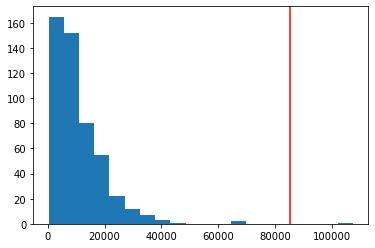

In [125]:
plt.hist(T_full_p_list, bins=20)
plt.axvline(T_obs,color='red')

This is across all d=4 embedding dimensions. We should split this out now to have 4 T_obs, one for each PC, and then get P replicates of T_PC_i

#### Testing if time matters in each of the 4 dimensions independently
I think we can do this as the dimensions are orthogonal

#### counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table.iloc[p , dim] > T_PC[dim]:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value
PC_p_values

In [126]:
# can square all the values in the `T_PC_p_table` table.
# This is to say we are looking at the value of   (mean_diff_A_p_i - mean_diff_B_p_i)**2
# when we look at row p, column i in the table

T_PC_p_table_squared = T_PC_p_table**2 # #square every value in df

Histograms for *mean_diff_A_p_i - mean_diff_B_p_i*, where there is a plot for each `i` (the dimension), and `P` counts. 

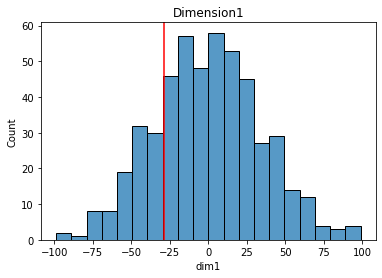

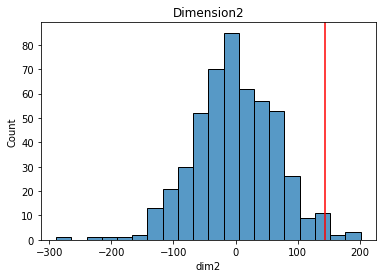

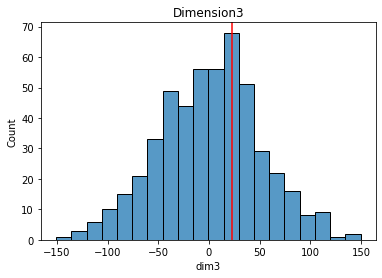

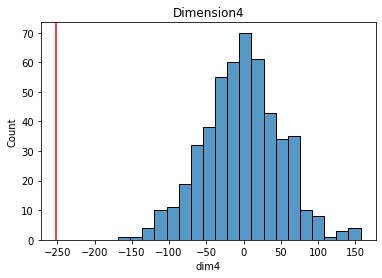

In [127]:
for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table.iloc[:,dim], bins=20)
    plt.axvline(T_PC[dim], color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

### Histograms for *(mean_diff_A_p_i - mean_diff_B_p_i)$^2$*, where there is a plot for each `i` (the dimension), and `P` counts. 

In [128]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table_squared.iloc[p , dim] > (T_PC[dim])**2:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_square_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value

# p-values for each dimension
PC_p_square_values

[0.41317365269461076,
 0.029940119760479042,
 0.6487025948103793,
 0.001996007984031936]

Tells us at the 2.5% significance level, we can see that only a significant change for PC3 in that we see a change between the 
**early** years (2005-2007) and the **late** years (2008-2010). This is for Urban-Rural status.

As Wales is not well-defined, it seems a bit difficult to trust this. 


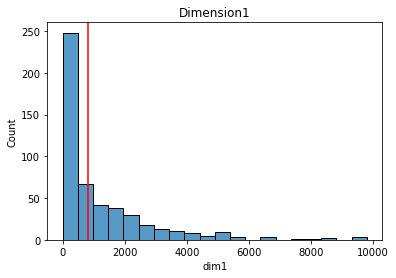

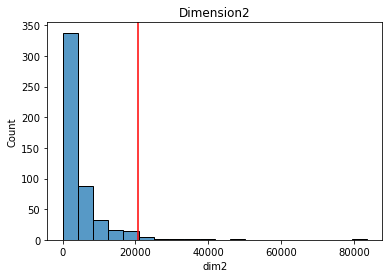

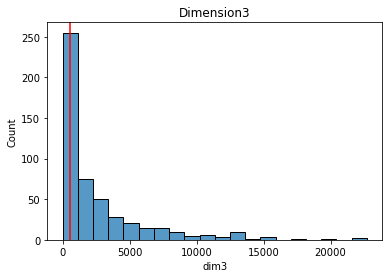

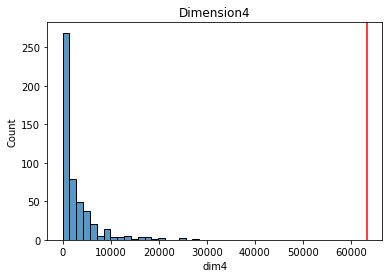

In [129]:
# squared values of distance between mean diff in groups A and B

for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table_squared.iloc[:,dim], bins=20)
    plt.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

In [130]:
urbanAllLondonCheck = df[(df["RGN11NM"]=="London" ) & (df['year']==2005) ]
#urbanAllLondonCheck
# all LADs in London are urban

In [132]:
summaries

,dim1,dim2,dim3,dim4,NorthIndicator,NorthorSouth,A_Indicator,AorB,permutation
A_North,-0.021686,-0.012205,-0.001709,0.009586,1,North,1,A,499
A_South,-0.014325,-0.002753,0.006530,-0.006340,0,South,1,A,499
B_North,-0.022372,-0.009338,-0.003179,0.010679,1,North,0,B,499
B_South,-0.014105,-0.002893,0.007658,-0.006313,0,South,0,B,499


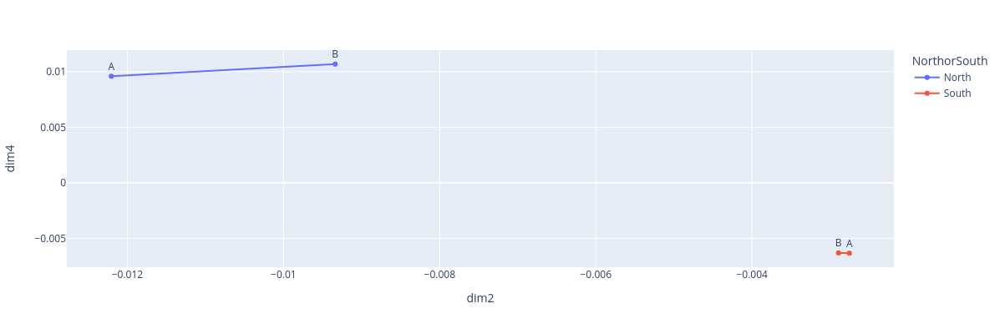

In [131]:
# same fig as before but with different size boundaries

fig = px.line(summaries, x='dim2', y='dim4', 
              color='NorthorSouth', markers=True,
              text='AorB',
                hover_data=['NorthorSouth'],
             width=1000, height=400)

fig.update_traces(textposition='top center')

# fig.add_annotation(x=summaries.loc['earlyNorth','dim3'], y=summaries.loc['earlyNorth','dim4'], text="Early North")
# fig.add_annotation(x=summaries.loc['earlySouth','dim3'], y=summaries.loc['earlySouth','dim4'], text="Early South")
# fig.add_annotation(x=summaries.loc['lateNorth','dim3'], y=summaries.loc['lateNorth','dim4'], text="Late North")
# fig.add_annotation(x=summaries.loc['lateSouth','dim3'], y=summaries.loc['lateSouth','dim4'], text="Late South")

fig.show()

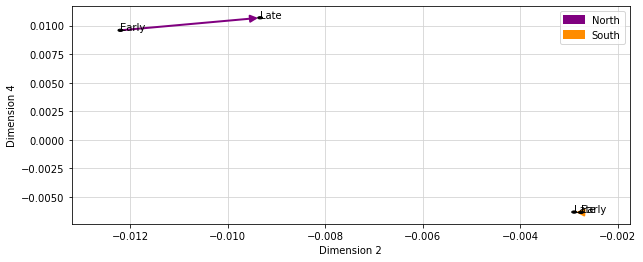

In [135]:
p1 = patches.FancyArrowPatch((summaries['dim2'][0], summaries['dim4'][0]), (summaries['dim2'][2], summaries['dim4'][2]), 
                             arrowstyle='-|>', mutation_scale=15, ec="purple", fc="purple", lw=2, label="North")
p2 = patches.FancyArrowPatch((summaries['dim2'][1], summaries['dim4'][1]), (summaries['dim2'][3], summaries['dim4'][3]), 
                             arrowstyle='-|>', mutation_scale=15, ec="darkorange", fc="darkorange", lw=2, label="South")

p3 = patches.Ellipse((summaries['dim2'][0], summaries['dim4'][0]), height=0.0002, width=0.0001, ec="black", fc="black")
p4 = patches.Ellipse((summaries['dim2'][1], summaries['dim4'][1]), height=0.0002, width=0.0001, ec="black", fc="black")
p5= patches.Ellipse((summaries['dim2'][2], summaries['dim4'][2]), height=0.0002, width=0.0001, ec="black", fc="black")
p6 = patches.Ellipse((summaries['dim2'][3], summaries['dim4'][3]), height=0.0002, width=0.0001, ec="black", fc="black")

fig, ax = plt.subplots(figsize=(10,4))
ax.add_patch(p1)
ax.add_patch(p2)
ax.add_patch(p3)
ax.add_patch(p4)
ax.add_patch(p5)
ax.add_patch(p6)

# adjust the x and y limits of the plot
eps = 0.001
ax.set_xlim(min(summaries['dim2'])-eps, max(summaries['dim2'])+eps)
ax.set_ylim(min(summaries['dim4'])-eps, max(summaries['dim4'])+eps)

plt.annotate(text="Early", xy = (summaries['dim2'][0], summaries['dim4'][0]))
plt.annotate(text="Late", xy = (summaries['dim2'][2], summaries['dim4'][2]))
plt.annotate(text="Late", xy = (summaries['dim2'][3], summaries['dim4'][3]))
plt.annotate(text="Early", xy = (summaries['dim2'][1], summaries['dim4'][1]))

#ax.set_facecolor('xkcd:pale blue')

plt.xlabel("Dimension 2")
plt.ylabel("Dimension 4")

plt.legend(loc="best")
ax.set_axisbelow(True)
ax.grid(color="lightgrey")

plt.show()

In [79]:
# looks like it's diverging too ? I think this has plot the right stuff, but not 100% certain

## Average per year movements of the Urban/Rural
-- 05/12/2022

In [ ]:
yearOnYear = []

for year in range(2005,2011):
    data = df[df['year'] == year]
    dataN = data[data['NorthIndicator']==0]
    dataS = data[data['NorthIndicator']==1]
    avgN = [np.mean(dataN['dim1']), np.mean(dataN['dim2']), np.mean(dataN['dim3']), np.mean(dataN['dim4']), "North" , year]
    avgS = [np.mean(dataS['dim1']), np.mean(dataS['dim2']), np.mean(dataS['dim3']), np.mean(dataS['dim4']), "South" , year]
    
    yearOnYear.append(avgN)
    yearOnYear.append(avgS)

In [ ]:
yearOnYear = pd.DataFrame(yearOnYear, columns=['dim1', 'dim2', 'dim3', 'dim4', 'NorS', 'year'])

Plot for each year to see what North and South are doing over time. Trying to justify splitting into early/late and testing. 

In [ ]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension={1+i}')
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)))
    N = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    years = range(2005,2011)
    ax.scatter(years, N, color="purple", label='Urban', marker='x') #plot London points
    a, b = np.polyfit(years, N, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="purple") # add LoB to plot
    ax.scatter(years, S, color="red", label='Rural', marker='x')
    a, b = np.polyfit(years, S, 1)
    ax.plot(years, a*years+b, color="red") 
    ax.legend(loc="best")
    
plt.savefig('AverageValueYearOnYear_UrbanRural_perDimension_GB_concWins.pdf')

# Summaries

* North/South - 
* London/not London - 
* Urban/Rural (badly defined) - 



In [ ]:
df['RGN11NM'].unique()